In [1]:
import pandas as pd
import os
import numpy as np
import librosa.display
import IPython
import matplotlib.pyplot as plt
import librosa
from scipy.io.wavfile import read as read_wav
import seaborn as sns
import torchaudio


In [2]:
import warnings
warnings.filterwarnings("ignore")

# Load Data

In [3]:
def load_data_to_df(data_dir='shords_dataset/'):
    data = []
    for cl in os.listdir(data_dir):
        class_dir = os.path.join(data_dir, cl)
        for file in os.listdir(class_dir):
            if file.endswith('wav'):
                file_path = os.path.join(class_dir, file)
                data.append({'file_path': file_path, 'class': cl})
    df = pd.DataFrame(data)
    return df

In [4]:
def play_audio(path):
    sampling_rate, data=read_wav(path)
    return IPython.display.Audio(path, rate = sampling_rate)

def print_single_spectrogram(path, title=None):
    sample_rate, data = read_wav(path)
    if data.ndim == 2:  # If stereo, convert to mono
        mono = (data[:, 0] + data[:, 1]) / 2
    else:  # If mono
        mono = data
    
    plt.figure(figsize=(10, 4))
    plt.specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
    plt.title(title if title else 'Spectrogram')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(label='Intensity [dB]')
    plt.show()

import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read as read_wav

def print_single_waveform(path, title=None):
    sample_rate, data = read_wav(path)
    if data.ndim == 2:  # If stereo, convert to mono
        mono = (data[:, 0] + data[:, 1]) / 2
    else:
        mono = data
    time = np.linspace(0, len(mono) / sample_rate, num=len(mono))
    
    plt.figure(figsize=(10, 4))
    plt.plot(time, mono)
    plt.title(title if title else 'Waveform')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.show()

# Example usage:
# plot_single_waveform('path_to_your_audio_file.wav', title='Waveform')


In [5]:
data = load_data_to_df()

In [6]:
def extract_features(file_path):
    y, sr = librosa.load(file_path, duration=30)
    features = {
        'mfcc': np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13).T, axis=0),
        'chroma': np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0),
        'spectral_contrast': np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0),
        'zero_crossing_rate': np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0),
        'rms': np.mean(librosa.feature.rms(y=y).T, axis=0),
        'length': librosa.get_duration(y=y, sr=sr)
    }
    return features

def create_features_df(data):
    features_list = []

    for index, row in data.iterrows():
        features = extract_features(row['file_path'])
        features['class'] = row['class']
        features_list.append(features)
    features_df = pd.DataFrame(features_list)
    return features_df


In [7]:

def print_multi_spectrogram(df, n):
    df_minor = df[df['class'] == 'minor'].sample(n=n)
    df_major = df[df['class'] == 'major'].sample(n=n)

    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(15, n * 5))

    for i, (index, row) in enumerate(df_minor.iterrows()):
        sample_rate, data = read_wav(row['file_path'])
        if data.ndim == 2:  # If stereo, convert to mono
            mono = (data[:, 0] + data[:, 1]) / 2
        else:  # If mono
            mono = data
        axes[i, 0].specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
        axes[i, 0].set_title(f"Minor - Sample {i+1}")
        axes[i, 0].set_ylabel('Frequency [Hz]')
        axes[i, 0].set_xlabel('Time [sec]')

    for i, (index, row) in enumerate(df_major.iterrows()):
        sample_rate, data = read_wav(row['file_path'])
        if data.ndim == 2:  # If stereo, convert to mono
            mono = (data[:, 0] + data[:, 1]) / 2
        else:  # If mono
            mono = data
        axes[i, 1].specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
        axes[i, 1].set_title(f"Major - Sample {i+1}")
        axes[i, 1].set_ylabel('Frequency [Hz]')
        axes[i, 1].set_xlabel('Time [sec]')

    plt.tight_layout()
    plt.show()

# EDA

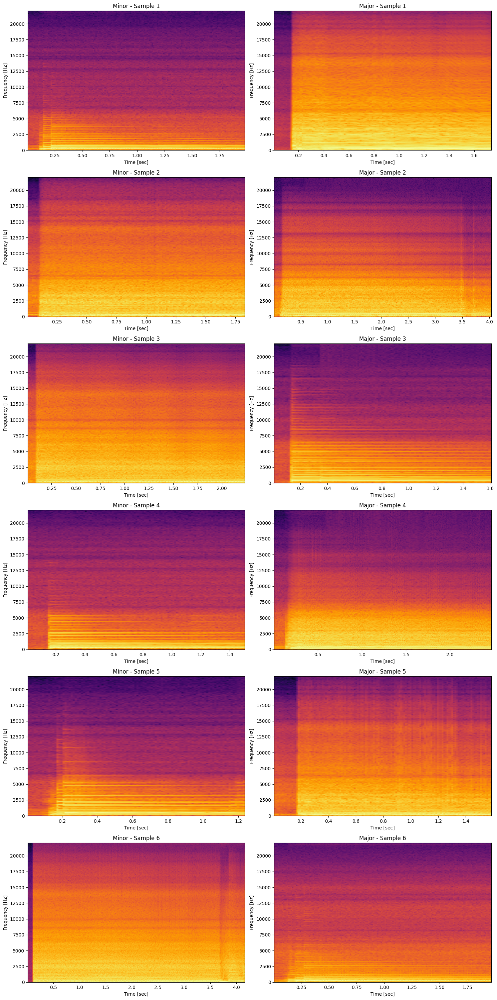

In [8]:
print_multi_spectrogram(data, 6)

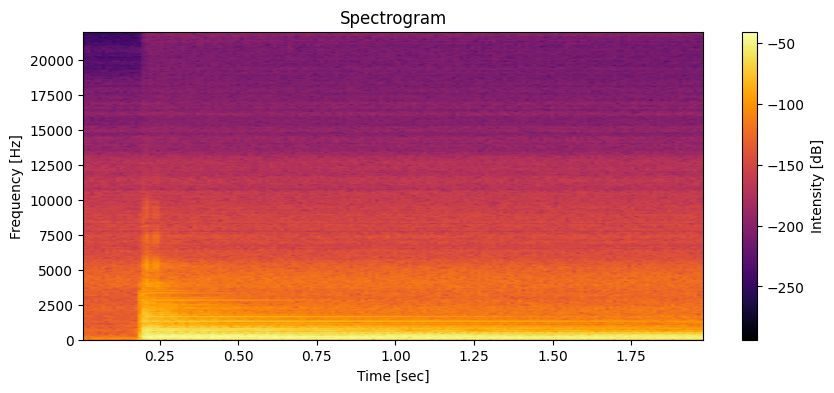

In [9]:
minor_example = data[data['class'] == 'minor'].sample(1).file_path.iloc[0]
print_single_spectrogram(minor_example)
play_audio(minor_example)

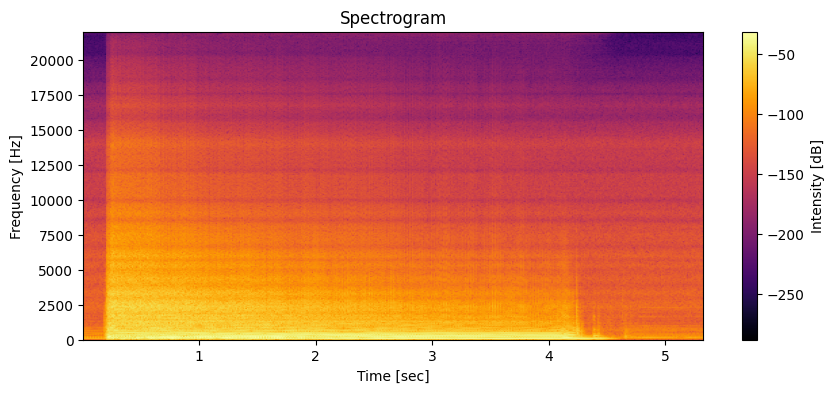

In [10]:
major_example = data[data['class'] == 'major'].sample(1).file_path.iloc[0]
print_single_spectrogram(major_example)
play_audio(major_example)

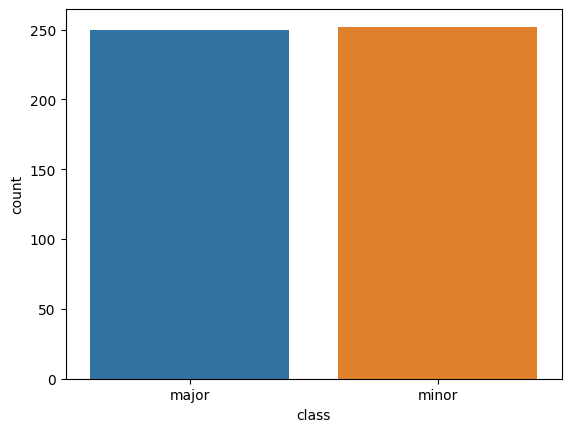

In [11]:
sns.countplot(data, x='class', hue='class')
plt.show()

In [12]:
features_df = create_features_df(data)

<Axes: xlabel='length', ylabel='Count'>

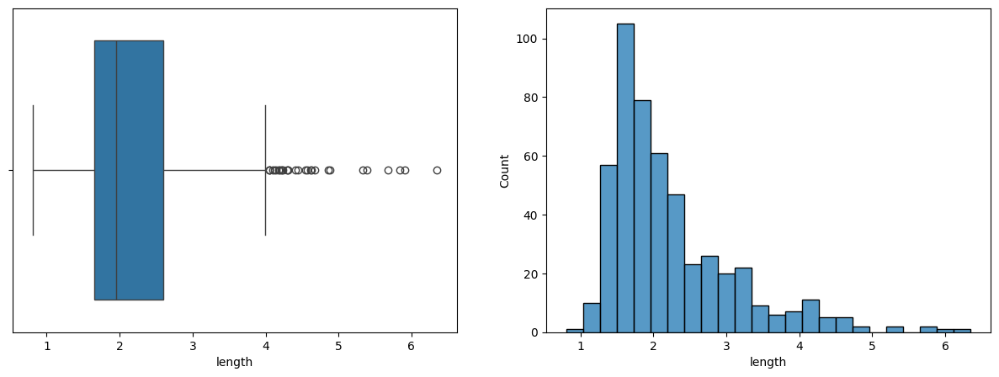

In [13]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 5))

sns.boxplot(data=features_df, x='length', ax=axes[0])
sns.histplot(data=features_df, x='length', ax=axes[1])


Example of long audio file

In [14]:
play_audio('shords_dataset/major/1_12.wav')

In [15]:
for col in features_df.columns:
    if col not in ['class', 'length']:
        print(features_df[col].apply(len).unique())

[13]
[12]
[7]
[1]
[1]


In [16]:
def faltten_df(features_df):
    flattened_df = features_df[['class']]
    for col in features_df.columns:
        if col not in ['class', 'length']:
            feature_length = features_df[col].apply(len).unique()[0]
            flattend_feature_df = pd.DataFrame(features_df[col].to_list(), columns = [f"{col}_{i}" for i in range(feature_length)])
            flattened_df = pd.merge(flattened_df, flattend_feature_df, left_index=True, right_index=True)
            
    class_mapping = {'major': 0, 'minor': 1}
    flattened_df['class'] = flattened_df['class'].map(class_mapping)
    return flattened_df

In [17]:
flattened_df = faltten_df(features_df)
flattened_df.head()

,class,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,chroma_11,spectral_contrast_0,spectral_contrast_1,spectral_contrast_2,spectral_contrast_3,spectral_contrast_4,spectral_contrast_5,spectral_contrast_6,zero_crossing_rate_0,rms_0
0,0,-476.763184,151.931259,40.750999,32.728512,24.676027,-1.622958,-11.382446,-10.255580,-13.852532,...,0.068089,41.048962,26.657022,31.112326,26.683215,26.611419,19.727297,40.896356,0.024277,0.050103
1,0,-335.800476,179.629593,55.251270,31.447277,13.783207,6.018884,-1.724098,-9.665527,0.166537,...,0.428835,39.272528,23.480823,26.503096,25.982533,20.851178,20.883398,40.702037,0.019306,0.159007
2,0,-208.606537,157.717743,-48.672695,61.206535,2.445855,2.241498,-3.198201,1.449560,-3.622945,...,0.113615,36.368816,19.868934,20.128331,17.285692,16.384238,25.410261,46.935719,0.041716,0.119327
3,0,-171.533829,132.515717,-62.749226,48.265671,-15.114235,-4.501721,-10.768104,1.647050,-3.750773,...,0.911918,35.620444,20.570914,22.997742,23.478727,20.850390,27.112645,47.863388,0.105496,0.087741
4,0,-319.415863,170.460342,-26.558022,46.639339,6.880424,-0.927866,-14.999014,-35.355858,2.813987,...,0.438278,29.648201,23.275417,29.477784,26.782898,29.655154,30.428208,43.645725,0.040360,0.102849


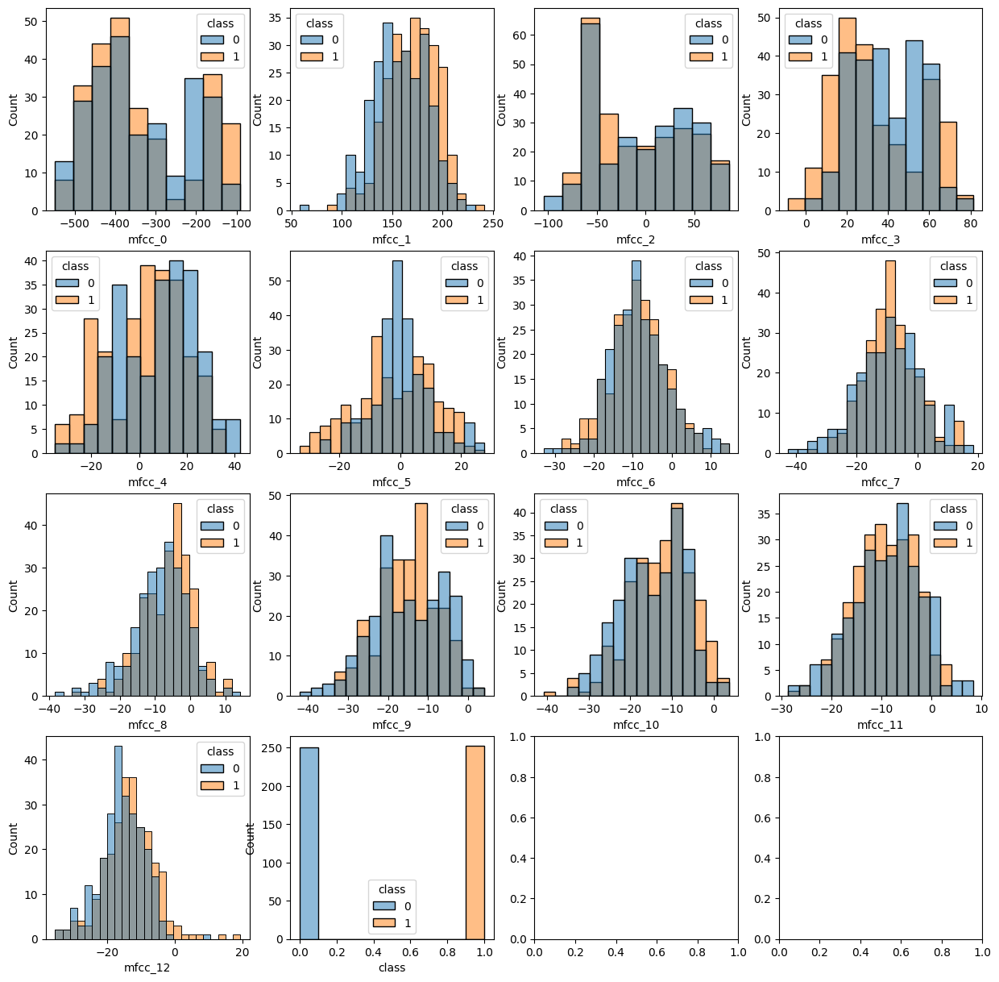

In [18]:
mfcc_columns = [col for col in flattened_df.columns if 'mfcc' in col] + ['class']

fig, axes = plt.subplots(ncols=4, nrows=4, figsize=(15, 15))

for i, ax in zip(mfcc_columns, axes.flat):
    sns.histplot(data=flattened_df, x=i, ax=ax, hue='class')
plt.show()


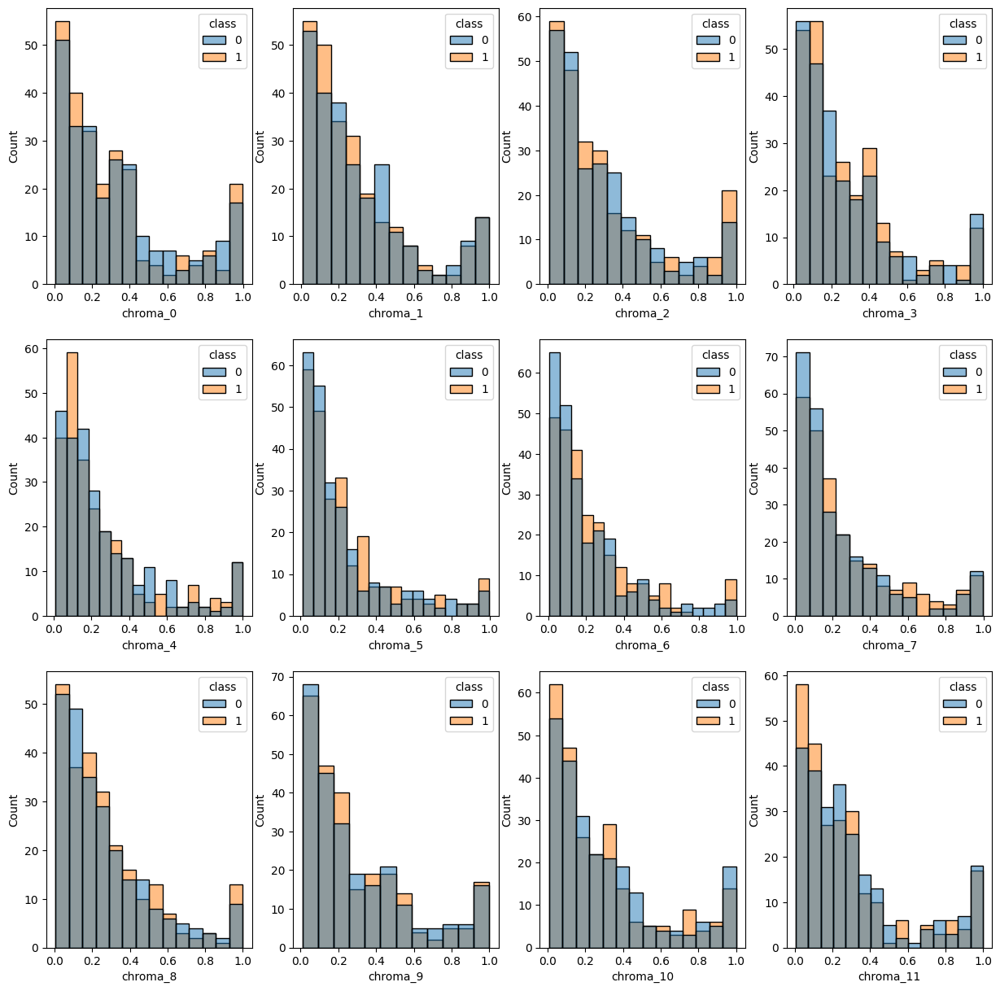

In [19]:
chroma_cols = [col for col in flattened_df.columns if 'chroma' in col] + ['class']
fig, axes = plt.subplots(ncols=4, nrows=3, figsize=(15, 15))

for i, ax in zip(chroma_cols, axes.flat):
    sns.histplot(data= flattened_df, x=i, ax=ax, hue='class')
plt.show()

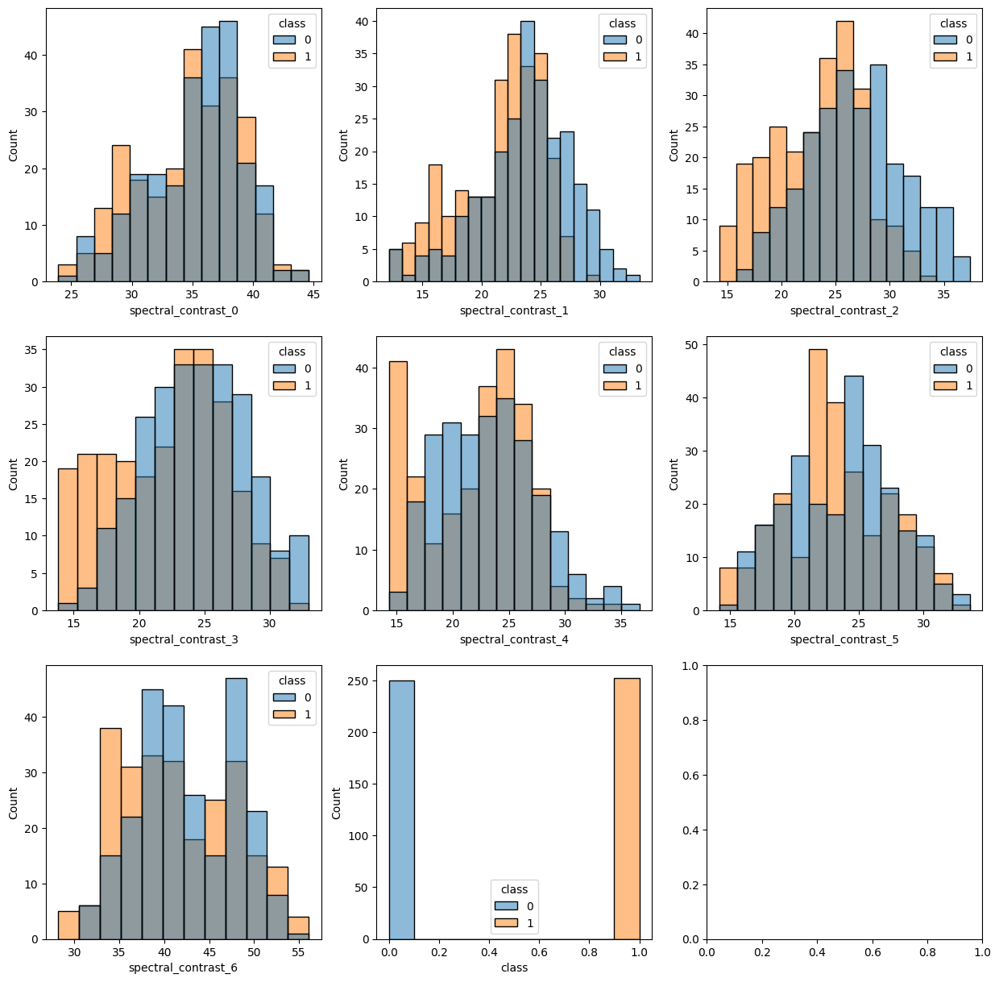

In [20]:
spectral_cols = [col for col in flattened_df.columns if 'spectral' in col] + ['class']
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(15, 15))

for i, ax in zip(spectral_cols, axes.flat):
    sns.histplot(data= flattened_df, x=i, ax=ax, hue='class')
plt.show()

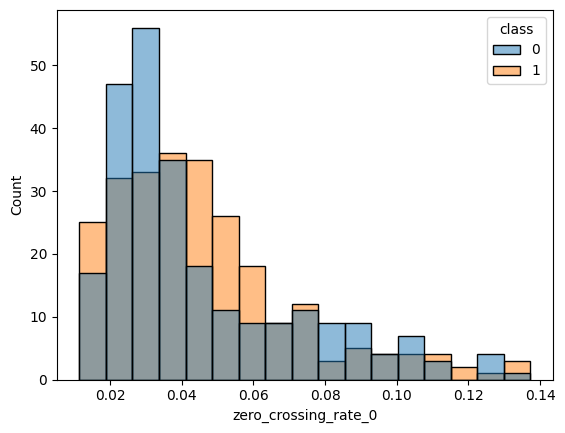

In [21]:
sns.histplot(data=flattened_df, x='zero_crossing_rate_0', hue='class')
plt.show()

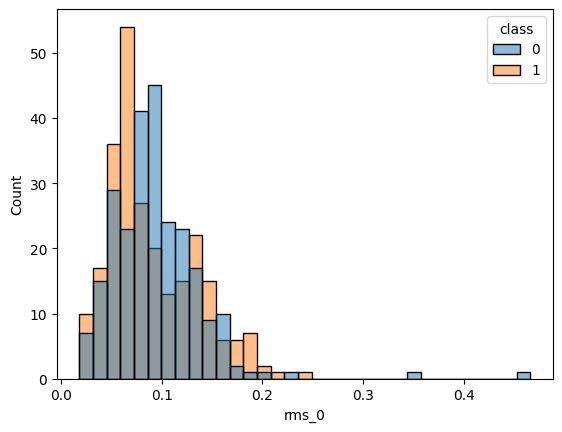

In [22]:
sns.histplot(data=flattened_df, x='rms_0', hue='class')
plt.show()

<Axes: >

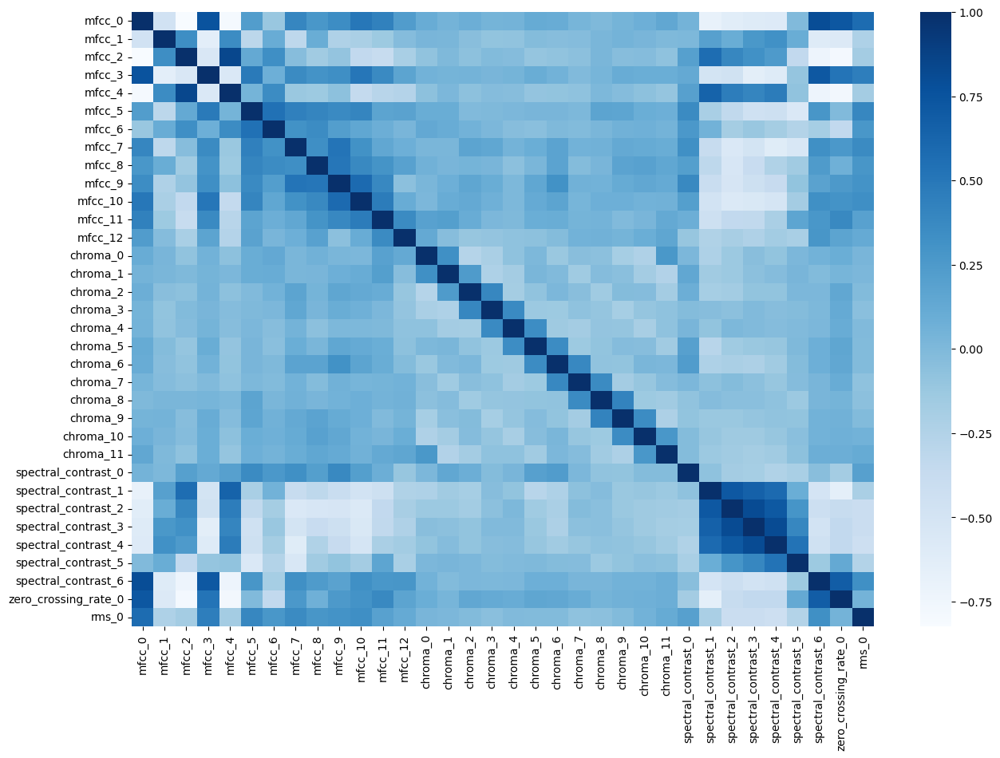

In [23]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(flattened_df.drop('class', axis=1).corr(), cmap='Blues')

# Classic ML

In [24]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [25]:
X = flattened_df.drop('class', axis=1)
y = flattened_df['class']

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

              precision    recall  f1-score   support

       major       0.91      0.83      0.87        77
       minor       0.84      0.92      0.88        74

    accuracy                           0.87       151
   macro avg       0.88      0.88      0.87       151
weighted avg       0.88      0.87      0.87       151

Accuracy: 0.8741721854304636
Confusion Matrix:
 [[64 13]
 [ 6 68]]


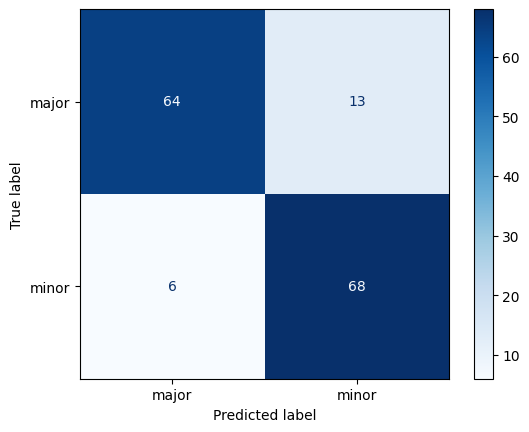

In [27]:
# Make predictions
y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=['major', 'minor']))

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', conf_matrix)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['major', 'minor'])
disp.plot(cmap=plt.cm.Blues)
plt.show()


In [133]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation accuracy: ", grid_search.best_score_)

best_xgb_model = grid_search.best_estimator_
best_xgb_model.fit(X_train, y_train)

y_pred_best = best_xgb_model.predict(X_test)

print("Best XGBoost Model Classification Report:\n", classification_report(y_test, y_pred_best, target_names=['major', 'minor']))
print("Best XGBoost Model Accuracy:", accuracy_score(y_test, y_pred_best))

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsamp

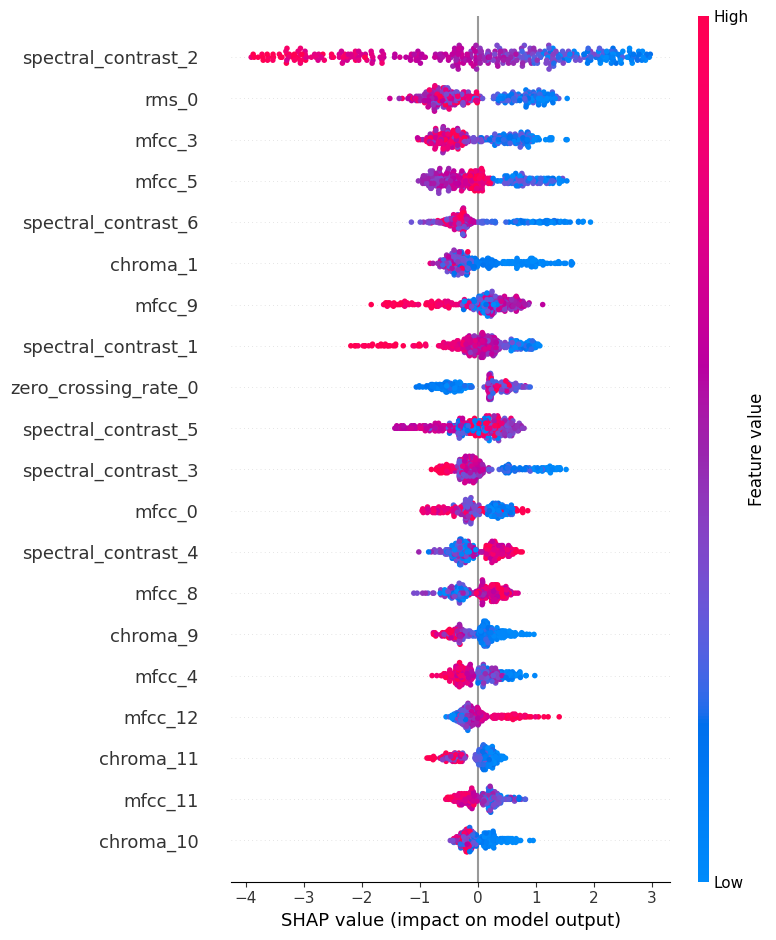

In [127]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

              precision    recall  f1-score   support

       major       0.84      0.86      0.85        77
       minor       0.85      0.82      0.84        74

    accuracy                           0.84       151
   macro avg       0.84      0.84      0.84       151
weighted avg       0.84      0.84      0.84       151

Accuracy: 0.8410596026490066
Confusion Matrix:
 [[66 11]
 [13 61]]


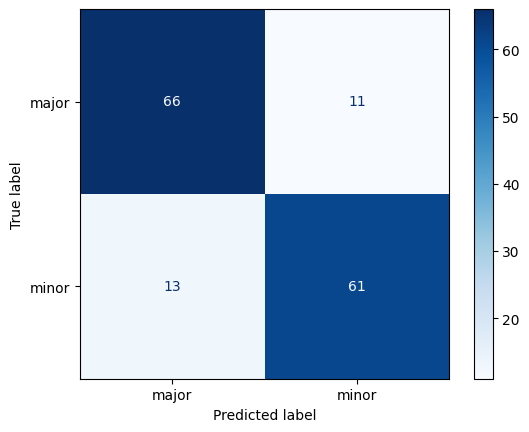

In [131]:
from sklearn.ensemble import RandomForestClassifier


rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=['major', 'minor']))

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', conf_matrix)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['major', 'minor'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [46]:
def record_chord(file_name, duration=5, sample_rate=44100):
    from IPython.display import Audio, display
    import sounddevice as sd
    import wavio

    print("Recording...")
    audio_data = sd.rec(int(duration * sample_rate), samplerate=sample_rate, channels=1, dtype='int16')
    sd.wait()  # Wait until recording is finished
    print("Recording finished")

    # Save the recorded audio to a file
    wavio.write(f"{file_name}.wav", audio_data, sample_rate, sampwidth=2)

    display(Audio(f"{file_name}.wav"))


def load_my_chord(file_path):
    y, sr = librosa.load(file_path, duration=30)
    features = {
        'mfcc': np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13).T, axis=0),
        'chroma': np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0),
        'spectral_contrast': np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0),
        'zero_crossing_rate': np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0),
        'rms': np.mean(librosa.feature.rms(y=y).T, axis=0),
        'length': librosa.get_duration(y=y, sr=sr)
    }
    df = pd.DataFrame([features]) 
    flattened_df = pd.DataFrame([{}])
    for col in df.columns:
        if col != 'length':
            feature_length = df[col].apply(len).unique()[0]
            flattend_feature_df = pd.DataFrame(df[col].to_list(), columns = [f"{col}_{i}" for i in range(feature_length)])
            flattened_df = pd.merge(flattened_df, flattend_feature_df, left_index=True, right_index=True)
    return flattened_df


In [45]:
record_chord("my_chord", duration=3)

Recording...
Recording finished


In [40]:
my_chord_x = load_my_chord("my_chord.wav")

In [41]:
model.predict_proba(my_chord_x)

array([[0.14402467, 0.85597533]], dtype=float32)

# Fully Connected

In [1]:
import pandas as pd
import os
import numpy as np
import librosa.display
import IPython
import matplotlib.pyplot as plt
import librosa
from scipy.io.wavfile import read as read_wav
import seaborn as sns
import torchaudio
import torch.nn as nn

import os
import pandas as pd
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import random
import torch
from torch.utils.data import Dataset, DataLoader

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
from torch.utils.data import DataLoader, TensorDataset

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("flattened_df.csv")
df.head()

,class,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,chroma_11,spectral_contrast_0,spectral_contrast_1,spectral_contrast_2,spectral_contrast_3,spectral_contrast_4,spectral_contrast_5,spectral_contrast_6,zero_crossing_rate_0,rms_0
0,0,-476.76318,151.93126,40.751000,32.728510,24.676027,-1.622958,-11.382446,-10.255580,-13.852532,...,0.068089,41.048962,26.657022,31.112326,26.683215,26.611419,19.727297,40.896356,0.024277,0.050103
1,0,-335.80048,179.62960,55.251270,31.447277,13.783207,6.018884,-1.724098,-9.665527,0.166537,...,0.428835,39.272528,23.480823,26.503096,25.982533,20.851178,20.883398,40.702037,0.019306,0.159007
2,0,-208.60654,157.71774,-48.672695,61.206535,2.445855,2.241497,-3.198201,1.449560,-3.622945,...,0.113615,36.368816,19.868934,20.128331,17.285692,16.384238,25.410261,46.935719,0.041716,0.119327
3,0,-171.53383,132.51572,-62.749226,48.265670,-15.114235,-4.501721,-10.768104,1.647050,-3.750773,...,0.911918,35.620444,20.570914,22.997742,23.478727,20.850390,27.112645,47.863388,0.105496,0.087741
4,0,-319.41586,170.46034,-26.558022,46.639340,6.880424,-0.927866,-14.999014,-35.355858,2.813988,...,0.438278,29.648201,23.275417,29.477784,26.782898,29.655154,30.428208,43.645725,0.040360,0.102849


In [3]:
# Separate features and labels
X = df.drop(columns=['class'])
y = df['class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [4]:
class FCNN(nn.Module):
    def __init__(self, input_size):
        super(FCNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.sigmoid(self.fc4(x))
        return x



In [5]:
# Instantiate the model
input_size = X_train.shape[1]
model = FCNN(input_size)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Lists to store loss and accuracy
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Train the model
num_epochs = 50

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    correct = 0
    total = 0
    
    for X_batch, y_batch in train_loader:
        # Forward pass
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        epoch_loss += loss.item()
        
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Calculate accuracy
        predicted = (outputs > 0.5).float()
        total += y_batch.size(0)
        correct += (predicted == y_batch).sum().item()
    
    avg_train_loss = epoch_loss / len(train_loader)
    train_accuracy = correct / total
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}')
    
    # Evaluate the model on validation data
    model.eval()
    with torch.no_grad():
        val_loss = 0
        correct = 0
        total = 0
        for X_batch, y_batch in test_loader:
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
        
        avg_val_loss = val_loss / len(test_loader)
        val_accuracy = correct / total
        val_losses.append(avg_val_loss)
        val_accuracies.append(val_accuracy)
        print(f'Epoch [{epoch+1}/{num_epochs}], Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')


Epoch [1/50], Train Loss: 0.6891, Train Accuracy: 0.5910
Epoch [1/50], Val Loss: 0.6818, Val Accuracy: 0.7426
Epoch [2/50], Train Loss: 0.6669, Train Accuracy: 0.6534
Epoch [2/50], Val Loss: 0.6597, Val Accuracy: 0.7228
Epoch [3/50], Train Loss: 0.6213, Train Accuracy: 0.7282
Epoch [3/50], Val Loss: 0.5987, Val Accuracy: 0.8119
Epoch [4/50], Train Loss: 0.5299, Train Accuracy: 0.7955
Epoch [4/50], Val Loss: 0.4946, Val Accuracy: 0.8119
Epoch [5/50], Train Loss: 0.4303, Train Accuracy: 0.8180
Epoch [5/50], Val Loss: 0.4239, Val Accuracy: 0.8416
Epoch [6/50], Train Loss: 0.3562, Train Accuracy: 0.8504
Epoch [6/50], Val Loss: 0.3970, Val Accuracy: 0.8614
Epoch [7/50], Train Loss: 0.3136, Train Accuracy: 0.8628
Epoch [7/50], Val Loss: 0.3573, Val Accuracy: 0.8713
Epoch [8/50], Train Loss: 0.2703, Train Accuracy: 0.8878
Epoch [8/50], Val Loss: 0.3569, Val Accuracy: 0.8812
Epoch [9/50], Train Loss: 0.2293, Train Accuracy: 0.9077
Epoch [9/50], Val Loss: 0.3265, Val Accuracy: 0.9010
Epoch [10/

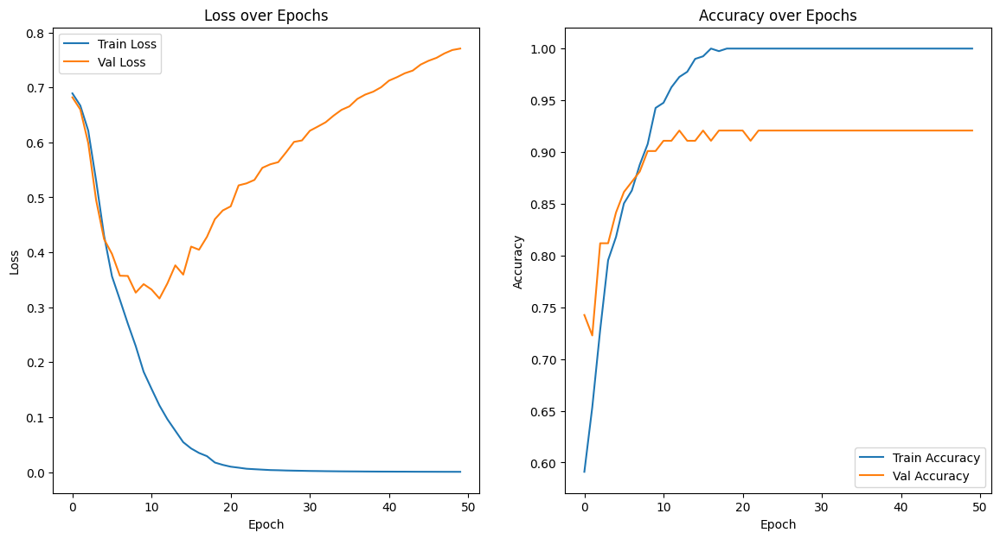

In [6]:
# Plot the training and validation loss and accuracy
plt.figure(figsize=(14, 7))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()

plt.show()

# CNN

In [68]:
import torch 
import torchaudio
import IPython
from scipy import signal
from scipy.io.wavfile import read as read_wav
import matplotlib.pyplot as plt
import torch.nn as nn

In [69]:
major_filenames = os.listdir('shords_dataset/major')
minor_filenames = os.listdir('shords_dataset/minor')

In [162]:
def specgram(file_path):
    waveform, _ = torchaudio.load(file_path)
    waveform = waveform.mean(axis=0)  # Convert to mono
        
        # Transform to spectrogram
    specgram = torchaudio.transforms.Spectrogram()(waveform)
        
    return specgram

In [108]:
data = load_data_to_df()

In [163]:
specgram(data.file_path.iloc[5]).shape

torch.Size([201, 714])

In [181]:
class Dataset(torch.utils.data.Dataset):
    
    def __init__(self, dir_path='shords_dataset/', major_filenames=major_filenames, minor_filenames=minor_filenames, fixed_size=(200, 350)):
        self.major_filenames = major_filenames
        self.minor_filenames = minor_filenames
        self.dir_path = dir_path
        self.fixed_size = fixed_size
        
    def __len__(self):
        return len(self.major_filenames) + len(self.minor_filenames)      
    
    def __getitem__(self, idx):
        is_major = idx < len(self.major_filenames)
        if is_major:
            path = self.dir_path + 'major/' + self.major_filenames[idx]
        else:
            path = self.dir_path + 'minor/' + self.minor_filenames[idx - len(self.major_filenames)]
        
        waveform, _ = torchaudio.load(path)
        waveform = waveform.mean(axis=0)  # Convert to mono
        
        # Transform to spectrogram
        specgram = torchaudio.transforms.Spectrogram()(waveform)
        
        # Pad or truncate the spectrogram to the fixed size
        target_freq, target_time = self.fixed_size
        freq, time = specgram.shape
        
        # Pad or truncate frequency dimension
        if freq < target_freq:
            pad_freq = target_freq - freq
            specgram = torch.nn.functional.pad(specgram, (0, 0, 0, pad_freq))
        else:
            specgram = specgram[:target_freq, :]
        
        # Pad or truncate time dimension
        if time < target_time:
            pad_time = target_time - time
            specgram = torch.nn.functional.pad(specgram, (0, pad_time))
        else:
            specgram = specgram[:, :target_time]
        
        return specgram.unsqueeze(0), is_major



In [192]:
import torch
from sklearn.model_selection import train_test_split


# Combine major and minor filenames with labels
filenames = major_filenames + minor_filenames
labels = [1] * len(major_filenames) + [0] * len(minor_filenames)

# Split into training + validation and test sets
train_val_filenames, test_filenames, train_val_labels, test_labels = train_test_split(filenames, labels, test_size=0.3, random_state=42)

# Split training + validation into training and validation sets
train_filenames, val_filenames, train_labels, val_labels = train_test_split(train_val_filenames, train_val_labels, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2

# Function to get filenames by class
def get_filenames_by_class(filenames, labels):
    major_filenames = [fname for fname, label in zip(filenames, labels) if label == 1]
    minor_filenames = [fname for fname, label in zip(filenames, labels) if label == 0]
    return major_filenames, minor_filenames

# Get filenames for each set by class
train_major_filenames, train_minor_filenames = get_filenames_by_class(train_filenames, train_labels)
val_major_filenames, val_minor_filenames = get_filenames_by_class(val_filenames, val_labels)
test_major_filenames, test_minor_filenames = get_filenames_by_class(test_filenames, test_labels)

# Create Dataset objects
train_dataset = Dataset(major_filenames=train_major_filenames, minor_filenames=train_minor_filenames)
val_dataset = Dataset(major_filenames=val_major_filenames, minor_filenames=val_minor_filenames)
test_dataset = Dataset(major_filenames=test_major_filenames, minor_filenames=test_minor_filenames)


In [199]:
from torch.utils.data import DataLoader

dataset = Dataset()

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [200]:
import torch
import torch.nn as nn

class CNNBlock(nn.Module):
    def __init__(self, input_dim, output_dim, dropout_rate=0.5):
        super(CNNBlock, self).__init__()
        self.conv = nn.Conv2d(input_dim, output_dim, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.bn = nn.BatchNorm2d(output_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        
    def forward(self, x):
        out = self.conv(x)
        out = self.pool(out)
        out = self.bn(out)
        out = self.relu(out)
        out = self.dropout(out)
        return out

class CNN(nn.Module):
    def __init__(self, dims, num_classes=2, dropout_rate=0.5):
        super(CNN, self).__init__()
        self.layers = nn.ModuleList([CNNBlock(dims[i-1], dims[i], dropout_rate) for i in range(1, len(dims))])
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(dims[-1], num_classes)
        
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        out = self.gap(x)
        out = out.view(out.size(0), -1)
        out = self.fc(out)
        return out

# Example usage
dims = [1,32,64,128]  # Example input dimensions
num_classes = 2
model = CNN(dims, num_classes)

# Print the model summary
print(model)


CNN(
  (layers): ModuleList(
    (0): CNNBlock(
      (conv): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
      (dropout): Dropout(p=0.5, inplace=False)
    )
    (1): CNNBlock(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
      (dropout): Dropout(p=0.5, inplace=False)
    )
    (2): CNNBlock(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_ru

In [201]:
epochs = 30

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

for epoch in range(epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    
    for idx, (data, label) in enumerate(train_loader):
        optimizer.zero_grad()
        data = data.to(device).float()
        label = label.to(device).long()  # Use long for CrossEntropyLoss
        
        pred = model(data)
        loss = criterion(pred, label)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        y_hat = torch.argmax(pred, dim=1)
        correct_train += (y_hat == label).sum().item()
        total_train += label.size(0)
        
        if idx % 100 == 0:
            print(f"Epoch {epoch} {idx}/{len(train_loader)} Loss = {loss.data:.03f}, acc = {correct_train / total_train:.02f}")
    
    # Validation phase
    model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for val_data, val_label in val_loader:
            val_data = val_data.to(device).float()
            val_label = val_label.to(device).long()
            
            val_pred = model(val_data)
            val_loss += criterion(val_pred, val_label).item()
            
            y_hat_val = torch.argmax(val_pred, dim=1)
            correct_val += (y_hat_val == val_label).sum().item()
            total_val += val_label.size(0)
    
    avg_train_loss = running_loss / len(train_loader)
    train_acc = correct_train / total_train
    avg_val_loss = val_loss / len(val_loader)
    val_acc = correct_val / total_val
    
    print(f"Epoch {epoch}: Train Loss = {avg_train_loss:.03f}, Train Acc = {train_acc:.02f}, Val Loss = {avg_val_loss:.03f}, Val Acc = {val_acc:.02f}")


Epoch 0 0/9 Loss = 0.702, acc = 0.47
Epoch 0: Train Loss = 0.717, Train Acc = 0.50, Val Loss = 0.688, Val Acc = 0.51
Epoch 1 0/9 Loss = 0.701, acc = 0.53
Epoch 1: Train Loss = 0.702, Train Acc = 0.50, Val Loss = 0.702, Val Acc = 0.53
Epoch 2 0/9 Loss = 0.680, acc = 0.44
Epoch 2: Train Loss = 0.681, Train Acc = 0.56, Val Loss = 0.706, Val Acc = 0.53
Epoch 3 0/9 Loss = 0.711, acc = 0.53
Epoch 3: Train Loss = 0.670, Train Acc = 0.59, Val Loss = 0.690, Val Acc = 0.56
Epoch 4 0/9 Loss = 0.645, acc = 0.69
Epoch 4: Train Loss = 0.655, Train Acc = 0.63, Val Loss = 0.670, Val Acc = 0.57
Epoch 5 0/9 Loss = 0.677, acc = 0.47
Epoch 5: Train Loss = 0.686, Train Acc = 0.60, Val Loss = 0.666, Val Acc = 0.55
Epoch 6 0/9 Loss = 0.663, acc = 0.59
Epoch 6: Train Loss = 0.669, Train Acc = 0.62, Val Loss = 0.640, Val Acc = 0.58
Epoch 7 0/9 Loss = 0.643, acc = 0.62
Epoch 7: Train Loss = 0.647, Train Acc = 0.60, Val Loss = 0.643, Val Acc = 0.61
Epoch 8 0/9 Loss = 0.621, acc = 0.62
Epoch 8: Train Loss = 0.625